# **YOLOv8 Model**

In [1]:
#Importing necessary libraries
import os
import numpy as np
import cv2
import pandas as pd
import random
import matplotlib.pyplot as plt
import shutil

In [2]:
#storing images in train and test folders created newly inside models
test_label_path = 'E:/Dog Face Detection using DL/Dataset/train_label'
paths = []

for dir, _, files in os.walk('E:/Dog Face Detection using DL/Dataset/train_img'):
    for file in files:
        paths.append(os.path.join(dir, file))

for i, path in enumerate(paths):
    if i<len(paths)*3//4:
        shutil.copy(path, 'datasets/train')
    else:
        shutil.copy(path, 'datasets/test')

In [3]:
#storing labels of respective images insie train and test folder
l_paths=[]
for dir, _, files in os.walk(test_label_path):
    for file in files:
        l_paths.append(os.path.join(dir, file))

for i, path in enumerate(l_paths):
    if i<len(l_paths)*3//4:
        shutil.copy(path, 'datasets/train')
    else:
        shutil.copy(path, 'datasets/test')

In [3]:
#importing necessary libraries to train YOLOv8 model
import ultralytics
from ultralytics import YOLO
from shutil import copyfile
from PIL import Image
from tqdm import tqdm
ultralytics.checks()

Ultralytics YOLOv8.2.14  Python-3.12.1 torch-2.3.0+cpu CPU (13th Gen Intel Core(TM) i7-1360P)
Setup complete  (16 CPUs, 15.7 GB RAM, 23.8/250.0 GB disk)


In [2]:
#specifying path
train_path='E:/Dog Face Detection using DL/Model/datasets/train'
test_path='E:/Dog Face Detection using DL/Model/datasets/test'
val_path='E:/Dog Face Detection using DL/Model/datasets/val'

In [5]:
#creating a yaml file to train the model
import yaml

data_yaml = dict(
    train=train_path,
    test=test_path,
    val=val_path,
    nc=1,
    names=['dog_face']
)

with open('data.yaml','w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)

In [6]:
#creating available classes(dog class) for image detection
class_map = dict(zip([0],['dog_face']))
model = YOLO("yolov8x.pt")

In [7]:
#training the model
train_results = model.train(data="data.yaml", epochs=1, imgsz=480)
#I have alrdy trained the model

Ultralytics YOLOv8.2.14  Python-3.12.1 torch-2.3.0+cpu 


ValueError: Invalid CUDA 'device=5,6,7' requested. Use 'device=cpu' or pass valid CUDA device(s) if available, i.e. 'device=0' or 'device=0,1,2,3' for Multi-GPU.

torch.cuda.is_available(): False
torch.cuda.device_count(): 0
os.environ['CUDA_VISIBLE_DEVICES']: None
See https://pytorch.org/get-started/locally/ for up-to-date torch install instructions if no CUDA devices are seen by torch.


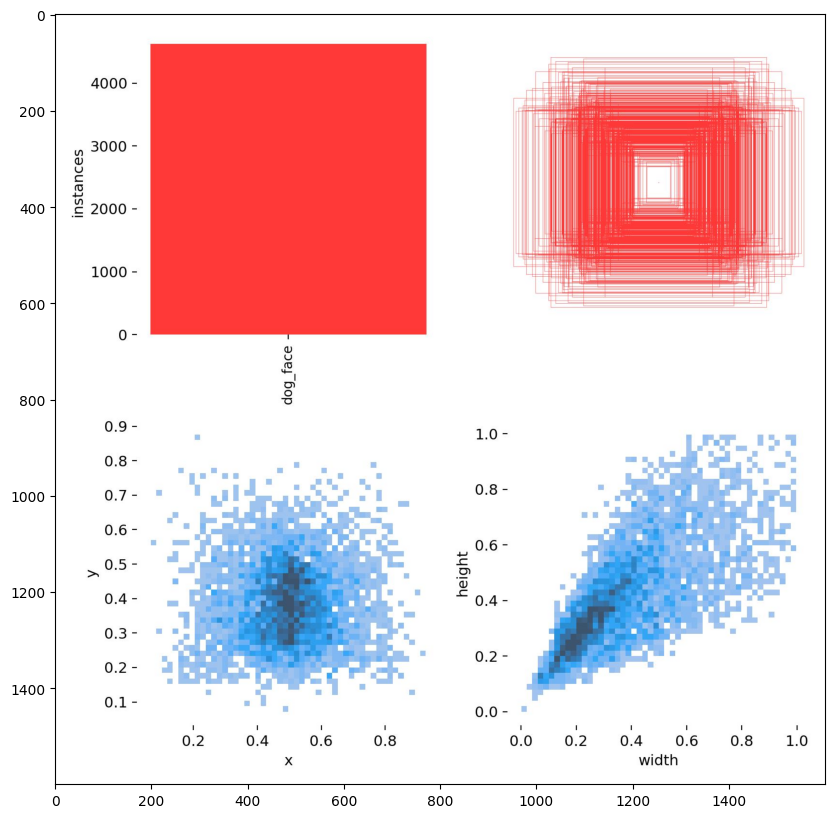

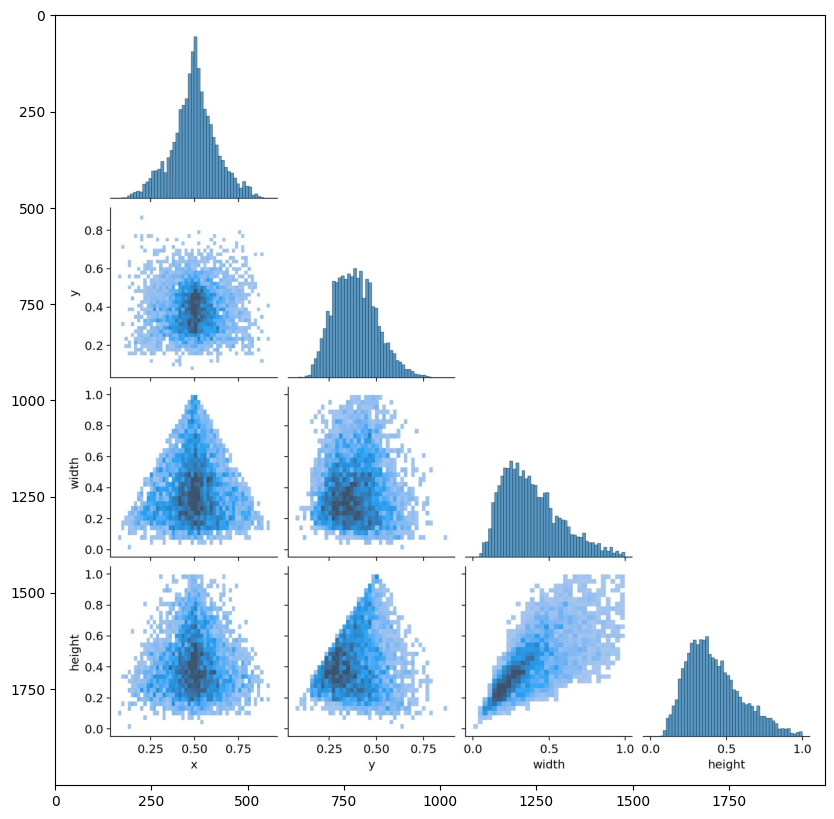

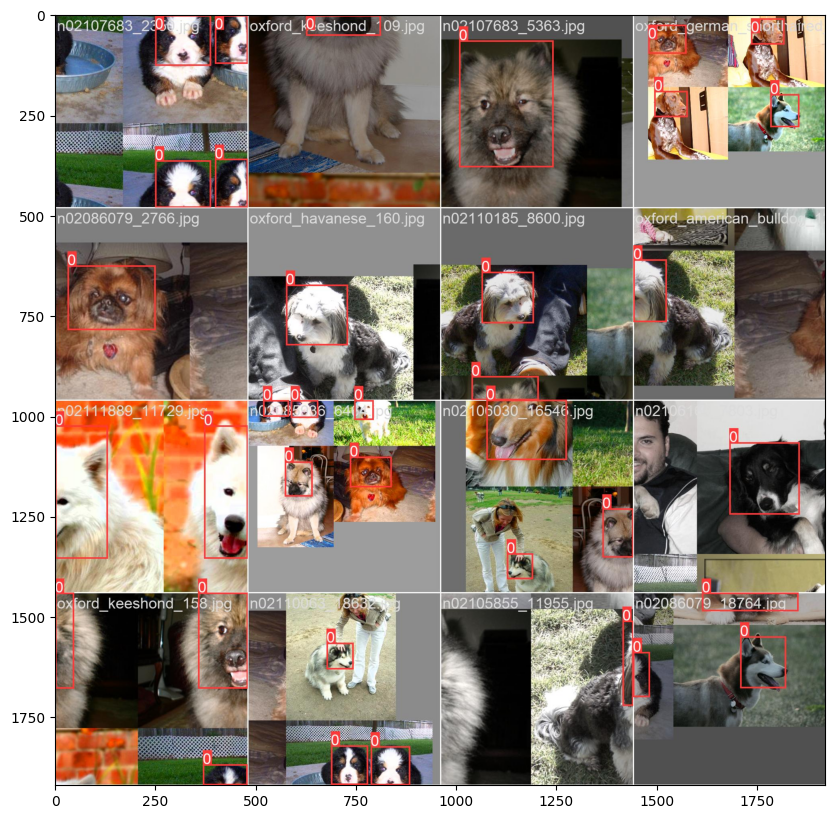

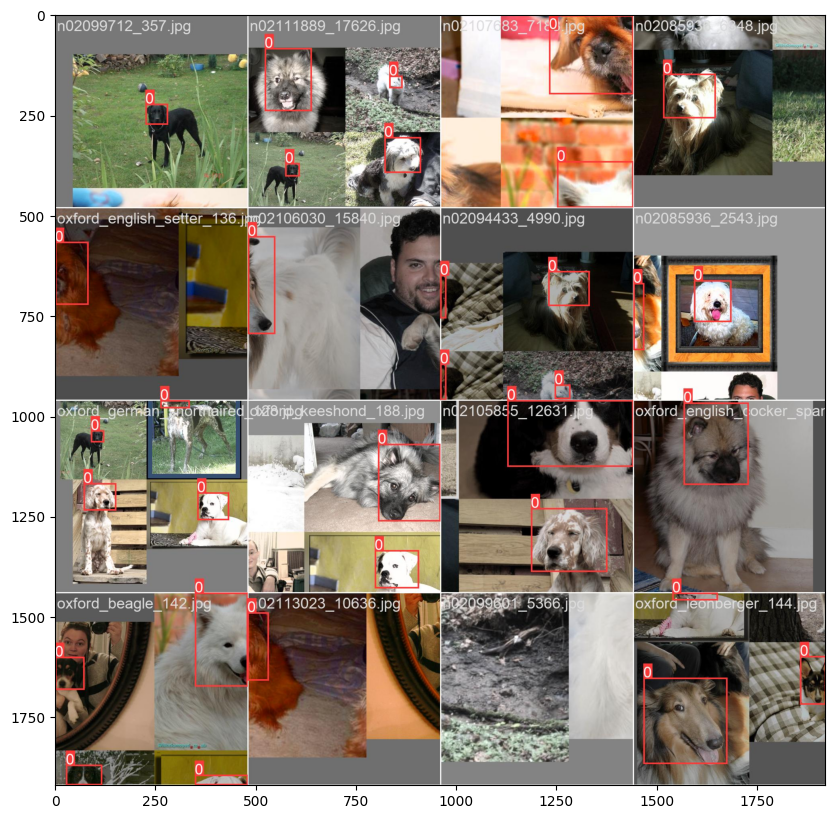

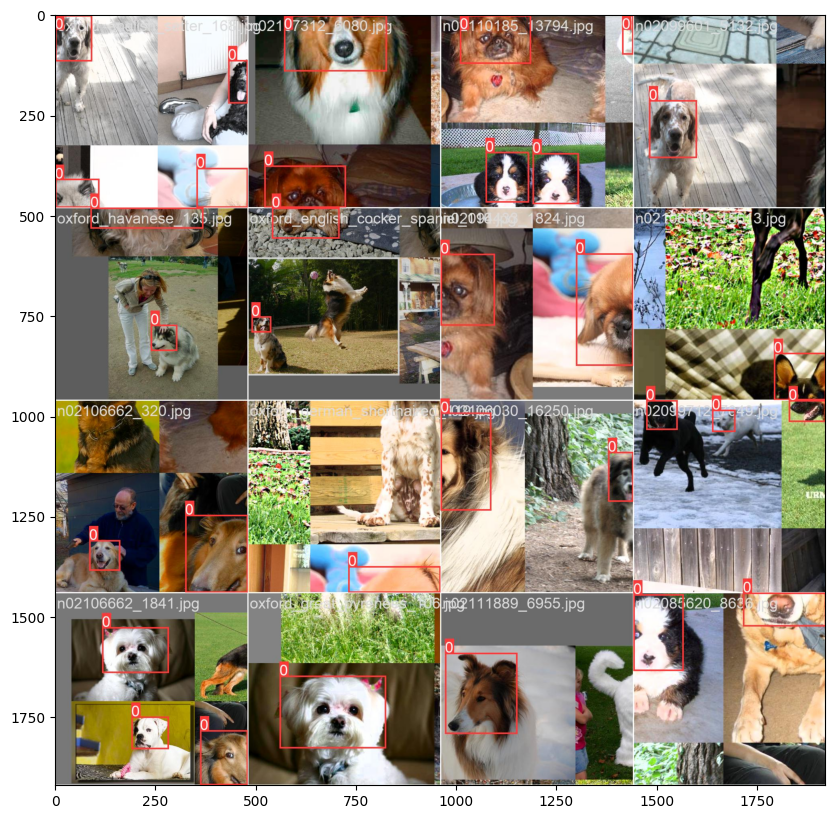

...

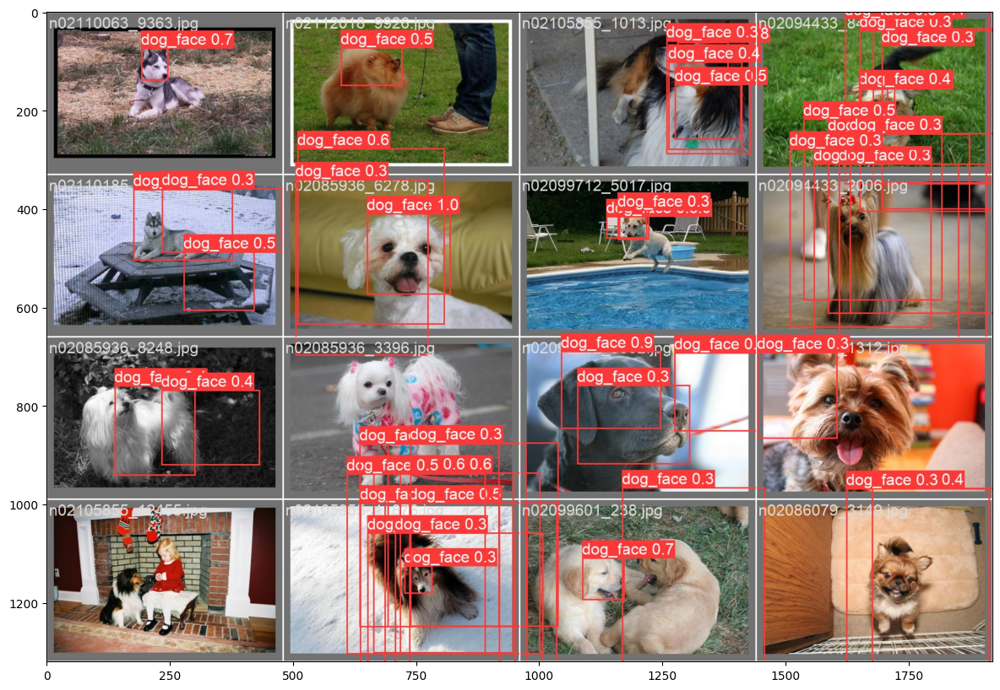

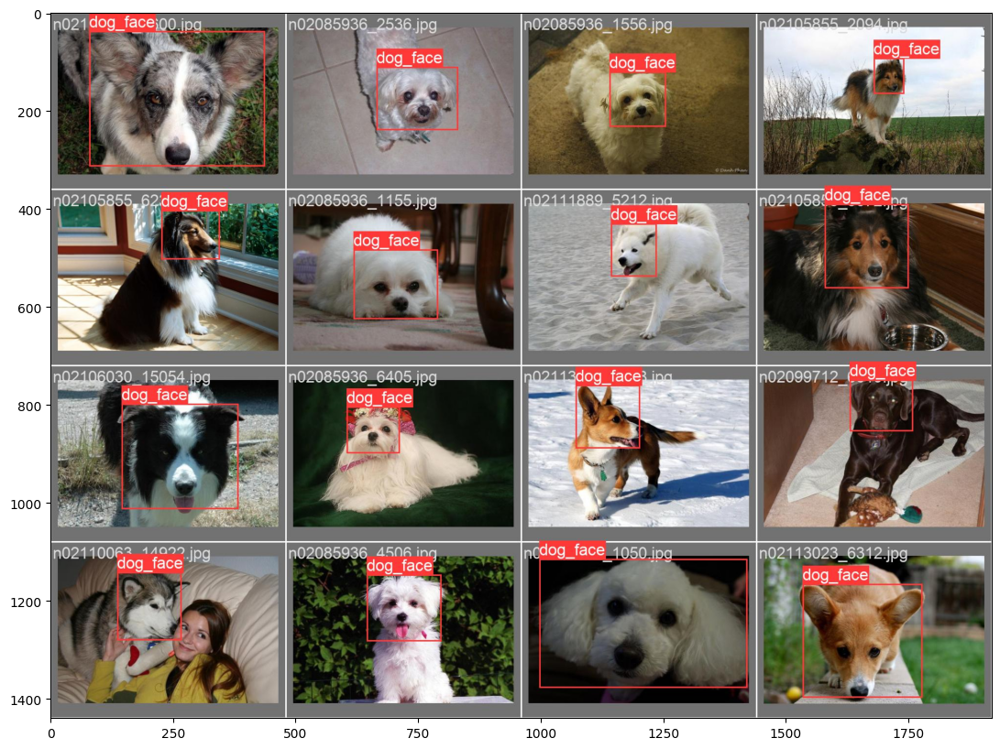

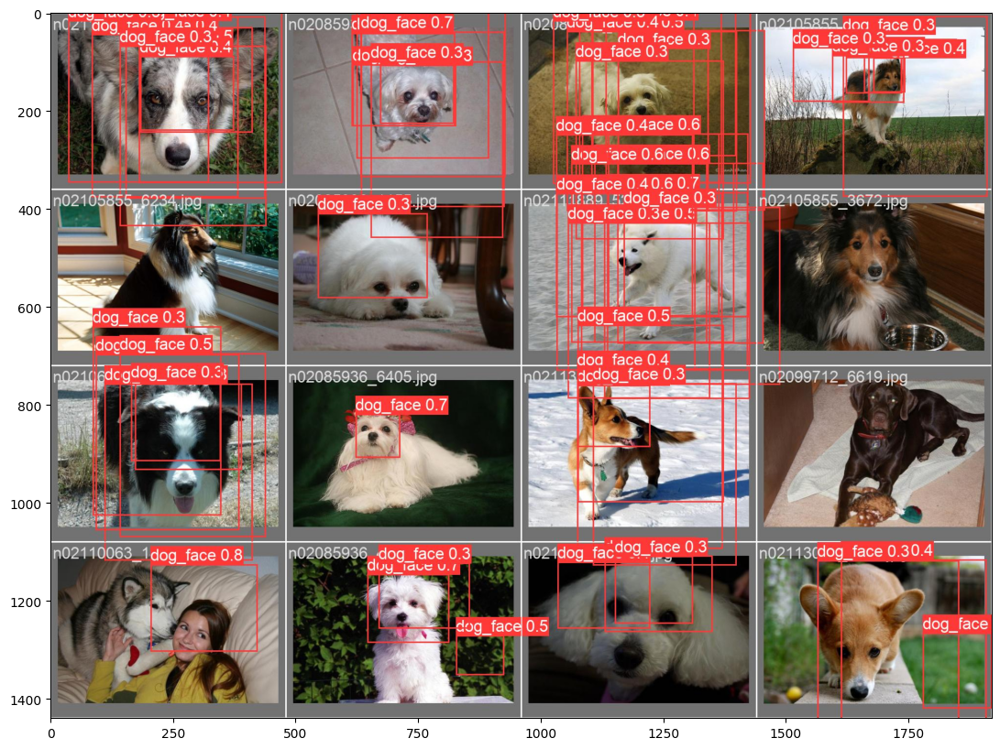

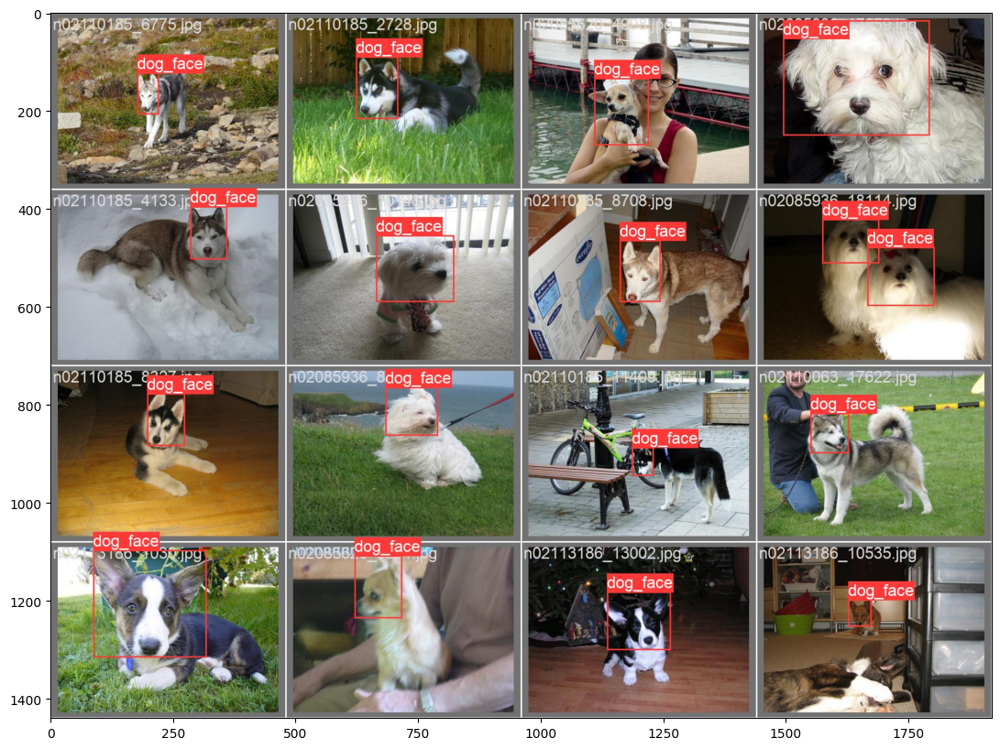

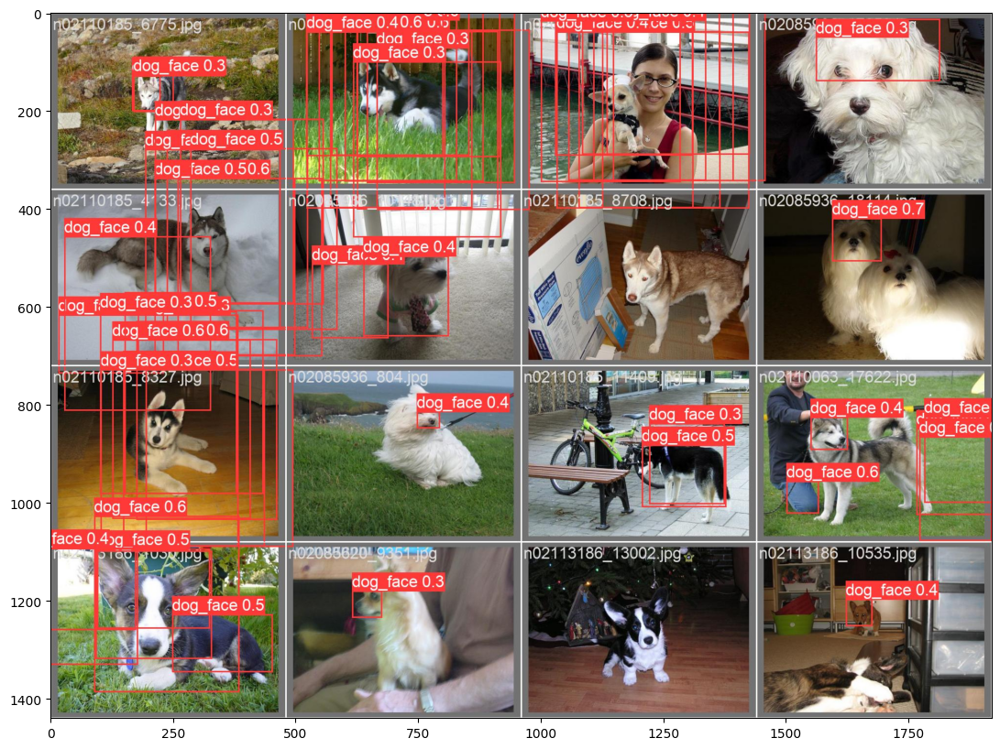

In [7]:
#showing results of trained images
trained_path = []
for dir, _, files in os.walk('runs/detect/train'):
    for file in files:
        if file[-4:]=='.jpg':
            trained_path.append(os.path.join(dir, file))

for path in trained_path:
    img = Image.open(path)
    img = np.array(img)
    plt.figure(figsize=(20,10))
    plt.imshow(img)
    plt.show()

In [10]:
#model prediction
trained_model = 'runs/detect/train/weights/best.pt'
pred_images = []

for dir, _, files in os.walk(test_path):
    for file in files:
        if file[-4:]=='.jpg':
            pred_images.append(os.path.join(dir,file))

model_pred=YOLO(trained_model)

In [11]:
#storing prediction results
pred_results = model_pred.predict(test_path, conf=0.5)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1481 E:\Dog Face Detection using DL\Model\datasets\test\oxford_miniature_pinscher_112.jpg: 384x480 1 dog_face, 570.0ms
image 2/1481 E:\Dog Face Detection using DL\Model\datasets\test\oxford_miniature_pinscher_113.jpg: 384x480 (no detections), 493.0ms
image 3/1481 E:\Dog Face Detection using DL\Model\datasets\test\oxford_miniature_pinscher_114.jpg: 384x480 1 dog_face, 437.0ms
image 4/1481 E:\Dog Face Detection using DL\Model\datasets\test\oxford_m

In [15]:
#Sample image results
#Will open one by one in the image viewing app while running
sample = 10
for result in pred_results:
    if sample<=0:
        break
    sample -= 1
    result.show()
#results added in Images folder

# **Mobilenet SSD Model**

In [ ]:
import os
base_path="Dataset/train_img"
images=os.path.sep.join([base_path,'images'])
annotations=os.path.sep.join([base_path,'train_label'])

In [ ]:
rows= open(annotations).read().strip().split("\n")

data=[]
targets=[]
filenames=[]

In [2]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
base_model = MobileNetV2(input_shape=(300, 300, 3), include_top=False, weights='imagenet')

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

C:\Users\rithi\AppData\Local\Temp\ipykernel_26908\3163434304.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_shape=(300, 300, 3), include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [191]:
model.compile(loss='mse',optimizer=opt)

In [189]:
model.summary()

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [192]:
history = model.fit(train_images,train_targets,validation_data=(test_images,test_targets),batch_size=32,epochs=50,verbose=1)

Epoch 1/50
23/23 [==============================] - 4s 155ms/step - loss: 0.0342 - val_loss: 0.0186
Epoch 2/50
23/23 [==============================] - 3s 152ms/step - loss: 0.0124 - val_loss: 0.0080
Epoch 3/50
23/23 [==============================] - 4s 153ms/step - loss: 0.0072 - val_loss: 0.0069
Epoch 4/50
23/23 [==============================] - 4s 155ms/step - loss: 0.0061 - val_loss: 0.0066
Epoch 5/50
23/23 [==============================] - 4s 155ms/step - loss: 0.0057 - val_loss: 0.0064
Epoch 6/50
23/23 [==============================] - 3s 151ms/step - loss: 0.0042 - val_loss: 0.0026
Epoch 7/50
23/23 [==============================] - 3s 148ms/step - loss: 0.0017 - val_loss: 0.0022
Epoch 8/50
23/23 [==============================] - 3s 147ms/step - loss: 0.0011 - val_loss: 0.0019
Epoch 9/50
23/23 [==============================] - 3s 146ms/step - loss: 7.5519e-04 - val_loss: 0.0020
Epoch 10/50
23/23 [==============================] - 3s 142ms/step - loss: 6.2409e-04 - val_loss

In [ ]:
import cv2
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
for row in rows:
  row=row.split(",")
  (filename,startX,startY,endX,endY)=row

  imagepaths=os.path.sep.join([images,filename])
  image=cv2.imread(imagepaths)
  (h,w)=image.shape[:2]

  startX = float(startX) / w
  startY = float(startY) / h 
  endX = float(endX) / w
  endY = float(endY) / h
  image=load_img(imagepaths,target_size=(224,224))
  image=img_to_array(image)

  targets.append((startX,startY,endX,endY))
  filenames.append(filename)
  data.append(image)


In [233]:
preds=model.predict(image)[0]
(startX,startY,endX,endY)=preds

In [234]:
import imutils

In [235]:
image=cv2.imread(imagepaths)
image=imutils.resize(image,width=600)

In [236]:
(h,w)=image.shape[:2]

In [237]:
startX=int(startX * w)
startY=int(startY * h)

endX=int(endX * w)
endY=int(endY * h)

In [238]:
cv2.rectangle(image,(startX,startY),(endX,endY),(0,255,0),3)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

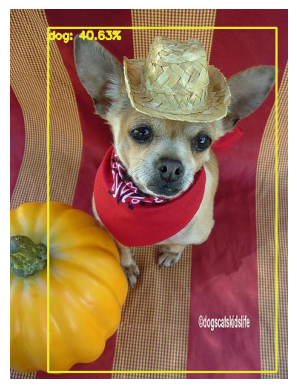

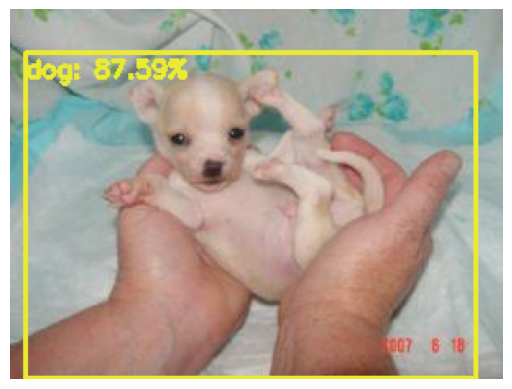

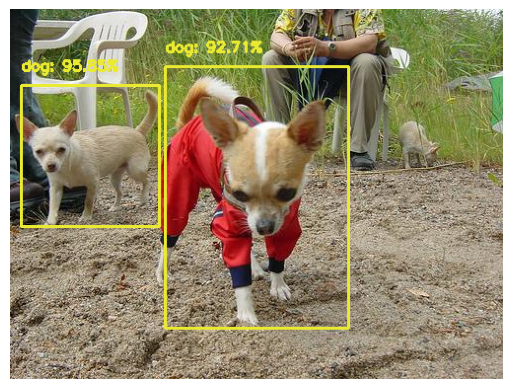

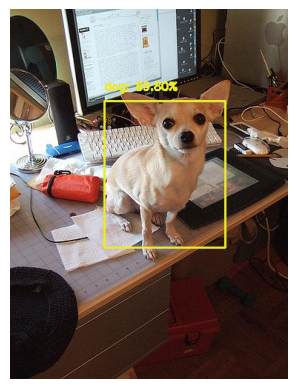

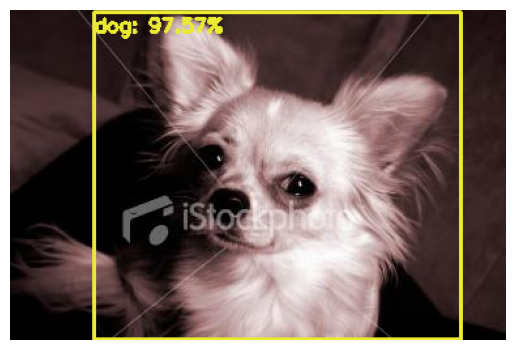

In [6]:
# import the necessary packages
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
	"bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
	"dog", "horse", "motorbike", "person", "pottedplant", "sheep",
	"sofa", "train", "tvmonitor"]
COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# load our serialized model from disk
model = 'MobileNetSSD_deploy.caffemodel'
ptxt = 'MobileNetSSD_deploy.prototxt.txt'
net = cv2.dnn.readNetFromCaffe(ptxt, model)

# load the input images from the directory
images_dir = 'E:/Dog Face Detection using DL/Dataset/train_img'
images = [os.path.join(images_dir, file) for file in os.listdir(images_dir)]

display_count = 0

# loop over the images
for img_path in images[:500]:
    image = cv2.imread(img_path)
    (h, w) = image.shape[:2]
    blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

    # pass the blob through the network and obtain the detections and
    # predictions
    net.setInput(blob)
    detections = net.forward()

    dog_detected = False
    for i in np.arange(0, detections.shape[2]):
        # extract the confidence (i.e., probability) associated with the
        # prediction
        confidence = detections[0, 0, i, 2]
        # greater than the minimum confidence
        if confidence > 0.3:
            idx = int(detections[0, 0, i, 1])
            if CLASSES[idx] == 'dog':  # Check if the detected object is a dog
                dog_detected = True
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # display the prediction
                label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
                cv2.rectangle(image, (startX, startY), (endX, endY),
                    COLORS[idx], 2)
                y = startY - 15 if startY - 15 > 15 else startY + 15
                cv2.putText(image, label, (startX, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLORS[idx], 2)
                
    # plot the output image using matplotlib if a dog is detected
    if dog_detected:
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
        
        display_count += 1
        if display_count >= 10:
            break


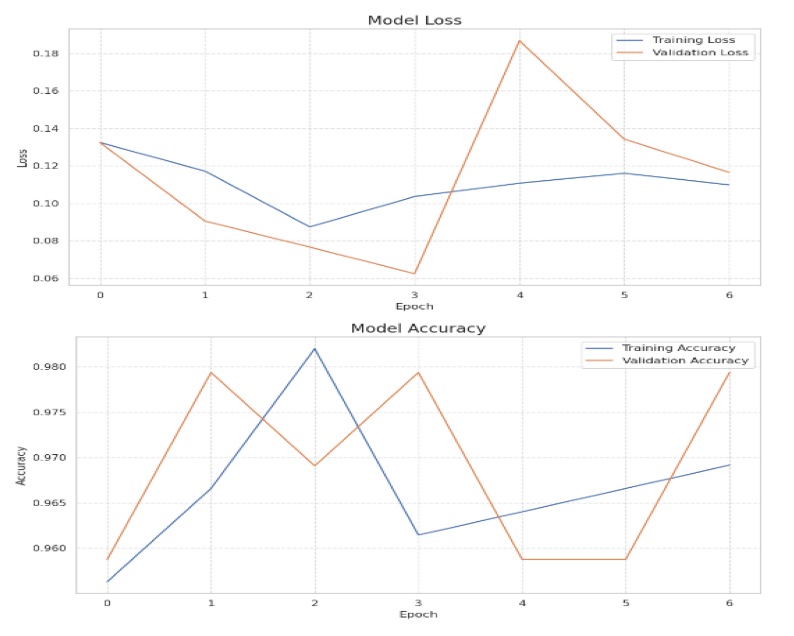

In [8]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.figure(figsize=(14, 5))

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'b-', label='Training Loss') 
plt.plot(epochs, val_loss, 'orange', label='Validation Loss') 
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'b-', label='Training Accuracy') 
plt.plot(epochs, val_acc, 'orange', label='Validation Accuracy') 
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.show()
